### Etapes couvertes 


To training a detector following those steps:

- Installing dependencies

- Download object detection data
- Telecharger la data a partir du repertoire d'ultralytics

- Write the Training configuration
- definition du fichier de configuration .yaml 
- definition des arguments de la fonction d'entrainement du modéle

- Run training
- Entrainement du modele sur la data choisi
- Evaluate performance
- evaluer le modele entrainé sur la data test en se basant sur des métrique

- Visualize training data
- visualization des données d'entrainement ainsi que la data augmentée

- Run inference on test images
- inferer le modele sur des images tests

- Exportiong the saved model weights for further inference
- exporter le modele choisi pour un usage ultérieur


#Install Dependencies

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5 # walk through the repo
#temporary until bug is fixed in current master
!git reset --hard 5ba1de0cdcc414c69ceb7a4c45eb1e3895eca32a
%cd /content

!pip install -r yolov5/requirements.txt  # install dependencies
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


/usr/local/lib/python3.6/dist-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla T4 with CUDA capability sm_75 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70.
If you want to use the Tesla T4 GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


# Download  Dataset with the specific format 

I will use the tool roboflow for more practical download of my training dataset. I use the export format corresponding to yolov5. a YAML file defining where your training and test data is. 

In [ ]:
# Export code snippet and paste here
%cd /content
#downloading the dataset for traininng and testing
!curl -L "https://app.roboflow.ai/ds/91yfF1ZaC7?key=quJB9wk7SA" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0    938      0 --:--:-- --:--:-- --:--:--   937
100  145M  100  145M    0     0  61.1M      0  0:00:02  0:00:02 --:--:--  151M
Archive:  roboflow.zip
 extracting: test/images/6996_jpg.rf.0fdd5f6e8d1765ac99f5e46deb36c5f8.jpg  
 extracting: test/images/6642_jpg.rf.0506aa535c731572ad0771e1b3729629.jpg  
 extracting: test/images/6741_jpg.rf.14108e182774683506bf0b0b6c3ae314.jpg  
 extracting: test/images/6627_jpg.rf.144b6c7a530d6a593966b23da56bd23f.jpg  
 extracting: test/images/1000001506_jpg.rf.0d909fc16398b281891bb66bbaa4825f.jpg  
 extracting: test/images/6530_jpg.rf.05d570febb0f189d5da63d63cd581c79.jpg  
 extracting: test/images/6675_jpg.rf.142312f979e6d987c2c85de02af69d3e.jpg  
 extracting: test/images/1000002877_jpg.rf.18553a0938b9ad11e0b275fe20f74f84.jpg  
 extracting: test/images/6546_jp

In [ ]:
# this is the YAML file that i'm  loading into this notebook with the data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['0']

# Model Configuration and Architecture Definition

i write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes on YAML file
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cd /content/
## i write model configuration .yaml
with open('yolov5/models/custom_yolov5s.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  #f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 0.33'  + '\n') # model depth multiple
  f.write('width_multiple: 0.50'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')

  f.write('backbone:' + '\n')
  f.write('  [[-1, 1, Focus, [64, 3]],' + '\n')
  f.write('   [-1, 1, Conv, [128, 3, 2]],' + '\n')
  f.write('   [-1, 3, Bottleneck, [128]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 3, 2]],' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [256]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 3, 2]], ' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [512]],' + '\n')
  f.write('   [-1, 1, Conv, [1024, 3, 2]],' + '\n')
  f.write('   [-1, 1, SPP, [1024, [5, 9, 13]]],' + '\n')
  f.write('   [-1, 6, BottleneckCSP, [1024]],' + '\n')
  f.write('  ]' + '\n')
  f.write('\n')

  f.write('head:'  + '\n')
  f.write('  [[-1, 3, BottleneckCSP, [1024, False]],'  + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  
  f.write('   [[-1, 6], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [512, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  f.write('   [[-1, 4], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [256, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('\n' )
  f.write('   [[], 1, Detect, [nc, anchors]],' + '\n')
  f.write('  ]' + '\n')

print('custom model config written!')

/content
custom model config written!


# Training the model Detector

### defining the training function arguments for the model


Definning to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder]
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# i choose to train the model for 50 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 256 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results --nosave --cache

UsageError: Line magic function `%%time` not found.


# Evaluate the model detection Performance

here i choose to to save training losses and performance metrics into the tensorboard the result file is plotted as a png after
training completes
Training losses and performance metrics are saved to Tensorboard, The results file is plotted as a png after training completes.

In [ ]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

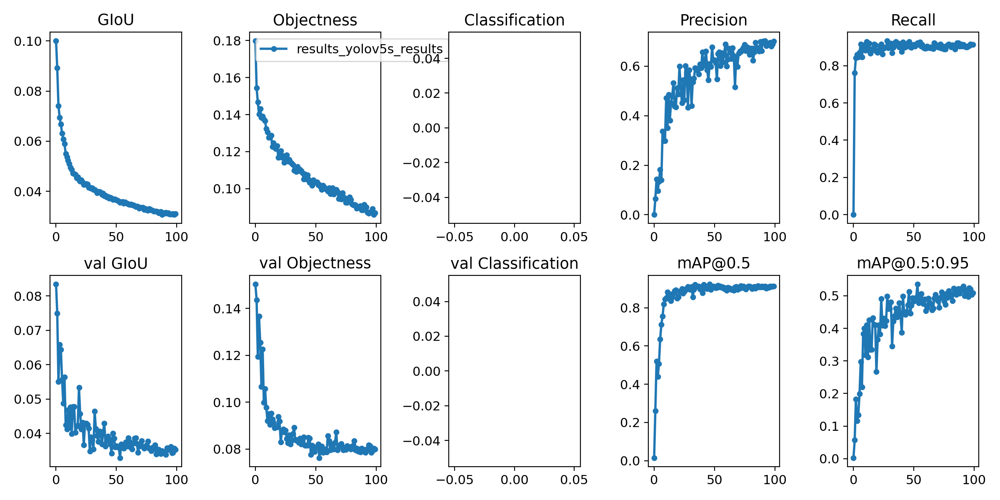

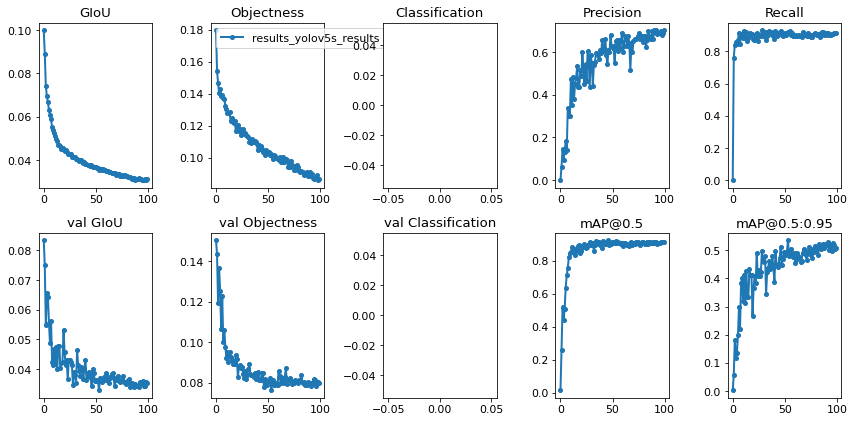

In [ ]:
#  plotting metrics graphs
from utils.utils import plot_results; plot_results()  # plot results.txt as results.png
Image(filename='./results.png', width=1000)  # view results.png

### Visualize the Training Data with Labels

After training starts,  i view `train*.jpg` images to see training images, labels and augmentation effects.

GROUND TRUTH TRAINING DATA:


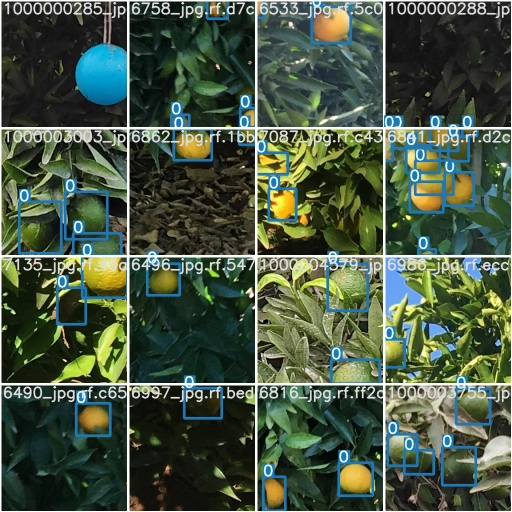

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


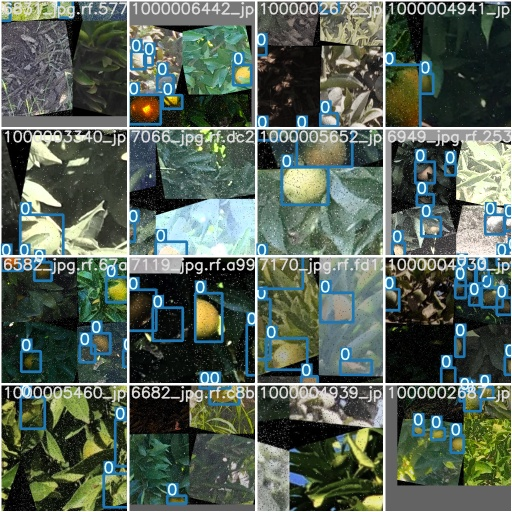

In [ ]:
#  i print out an augmented training example
# get a look on augmented exmaples
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` 

In [ ]:
# trained weights are saved by default in our weights folder
%ls weights/

download_weights.sh*  last_yolov5s_results.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
%cd /content/yolov5/
!python detect.py --weights weights/last_yolov5s_results.pt --img 256 --conf 0.4 --source ../test/images


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=256, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights='weights/last_yolov5s_results.pt')
/usr/local/lib/python3.6/dist-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla T4 with CUDA capability sm_75 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70.
If you want to use the Tesla T4 GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

image 1/100 ../test/images/1000000244_jpg.rf.57e9f61a8cdb16204dbd7ae9dfd0213f.jpg: 256x256 Done. (0.008s)
image 2/100 ../test/images/1000000261_jpg.rf.6c511ce84

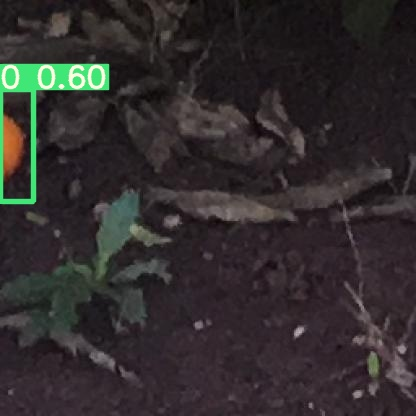

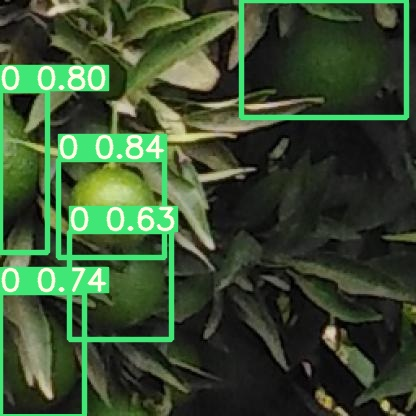

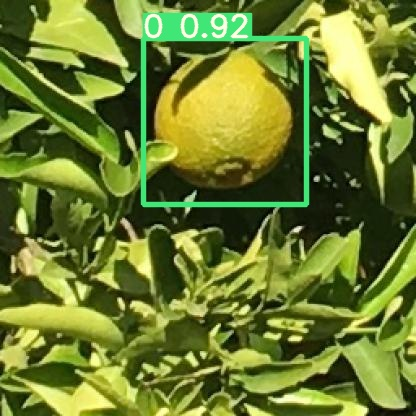

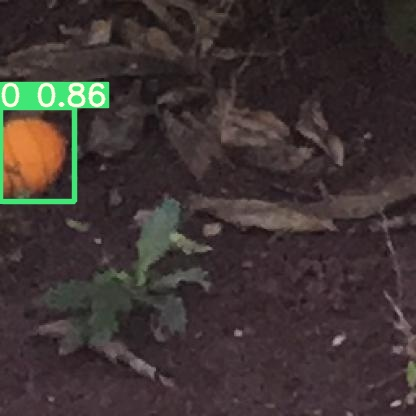

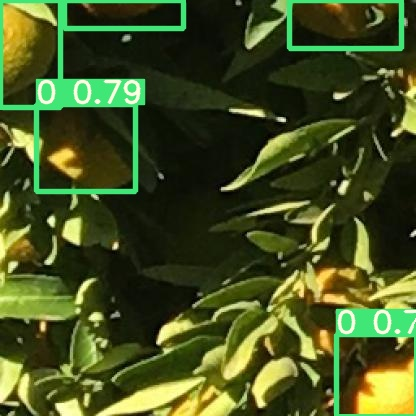

...

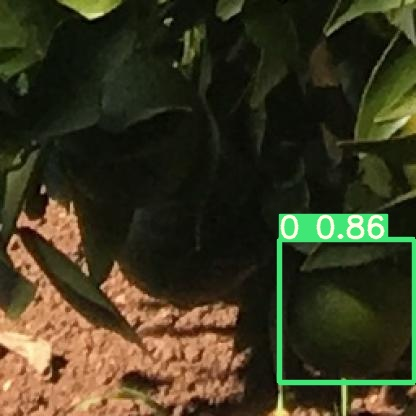

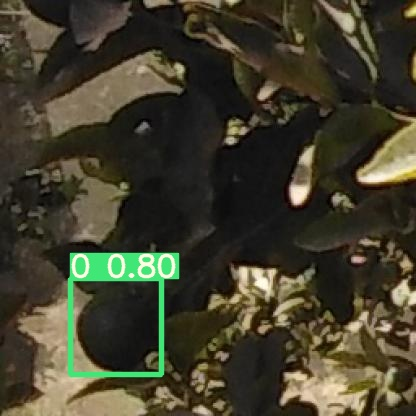

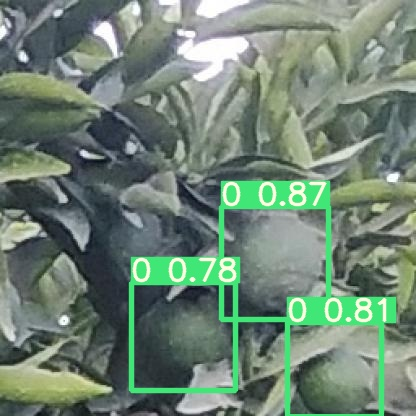

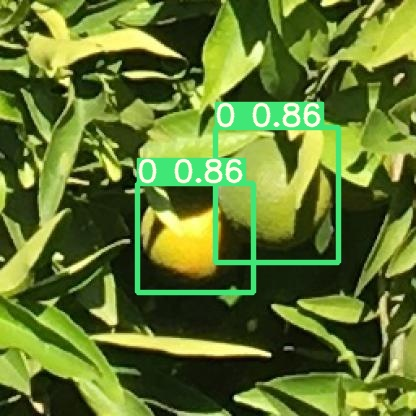

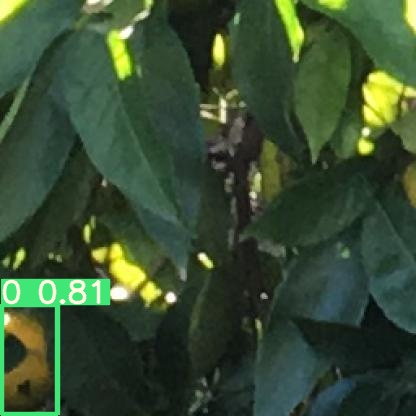

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights

I have trained a detector based on agriculture imagery, i export the trained weights i have made here for inference on my device

In [ ]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')
zip_ref = zipfile.ZipFile("/content/drive/My Drive/LESIMAGES.zip", 'r')
zip_ref.extractall("/tmp")
zip_ref.close()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
#!python detect.py --output ./inference/SAOUDA22030out/ --source ./inference/SAOUDA22030/ --weights ./weights/last_yolov5s_results.pt --conf 0.4 --img-size 512
#!python detect.py --output ./inference/SAOUDA23020out/ --source ./inference/SAOUDA23020/ --weights ./weights/last_yolov5s_results.pt --conf 0.4 --img-size 512
#!python detect.py --output ./inference/SAOUDA23030out/ --source ./inference/SAOUDA23030/ --weights ./weights/last_yolov5s_results.pt --conf 0.4 --img-size 512
!python detect.py --output ./inference/11010out/ --source ./inference/11010/ --weights ./weights/last_yolov5s_results.pt --conf 0.4 --img-size 256


Streaming output truncated to the last 5000 lines.
image 1637/1650 inference/21010_Volkameriana/987.jpg: 256x256 Done. (0.010s)
image 1638/1650 inference/21010_Volkameriana/988.jpg: 256x256 Done. (0.008s)
image 1639/1650 inference/21010_Volkameriana/989.jpg: 256x256 Done. (0.009s)
image 1640/1650 inference/21010_Volkameriana/99.jpg: 256x256 Done. (0.008s)
image 1641/1650 inference/21010_Volkameriana/990.jpg: 256x256 1 0s, Done. (0.009s)
image 1642/1650 inference/21010_Volkameriana/991.jpg: 256x256 Done. (0.008s)
image 1643/1650 inference/21010_Volkameriana/992.jpg: 256x256 Done. (0.008s)
image 1644/1650 inference/21010_Volkameriana/993.jpg: 256x256 Done. (0.008s)
image 1645/1650 inference/21010_Volkameriana/994.jpg: 256x256 Done. (0.008s)
image 1646/1650 inference/21010_Volkameriana/995.jpg: 256x256 Done. (0.008s)
image 1647/1650 inference/21010_Volkameriana/996.jpg: 256x256 Done. (0.008s)
image 1648/1650 inference/21010_Volkameriana/997.jpg: 256x256 Done. (0.008s)
image 1649/1650 infe

In [ ]:
!python detect.py --output ./inference/41050out/ --source ./inference/41050/ --weights ./weights/last_yolov5s_results.pt --conf 0.4 --img-size 256

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=256, iou_thres=0.5, output='./inference/41050out/', save_txt=False, source='./inference/41050/', update=False, view_img=False, weights='./weights/last_yolov5s_results.pt')
/usr/local/lib/python3.6/dist-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla T4 with CUDA capability sm_75 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70.
If you want to use the Tesla T4 GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

image 1/1920 inference/41050/1.jpg: 256x256 Done. (0.009s)
image 2/1920 inference/41050/10.jpg: 256x256 Done. (0.010s)
image 3/1920 inference/41050/100.jpg: 256x256 

In [ ]:
!export PYTHONPATH="$PWD" && python models/export.py --weights ./weights/last_yolov5s_results.pt --img 256 --batch 1

Namespace(batch_size=1, img_size=[256, 256], weights='./weights/last_yolov5s_results.pt')

Starting TorchScript export with torch 1.5.1+cu101...
TorchScript export success, saved as ./weights/last_yolov5s_results.torchscript
ONNX export failure: No module named 'onnx'
CoreML export failure: No module named 'coremltools'

Export complete. Visualize with https://github.com/lutzroeder/netron.
